<a href="https://colab.research.google.com/github/colleenjg/neuromatch_ssl_tutorial/blob/main/Neuromatch_SSL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Neuromatch Academy: Week 3, Day 1, Tutorials
# Unsupervised and self-supervised learning: Representations

__Content creators:__ Arna Ghosh, Colleen Gillon.

__Content reviewers:__ Blake Richards, Tim Lillicrap. 

__Content editors:__ Blake Richards, Tim Lillicrap.

__Production editors:__ Blake Richards, Tim Lillicrap.  

---
#Tutorial Objectives

In this tutorial, you will learn about the importance of learning good representations of data.

Specific objectives for this tutorial:
*   Train logistic regressions (A) directly on input data and (B) on representations learned from the data.
*   Compare the classification performances achieved by the different networks.
*   Compare the representations learned by the different networks
*   Identify the advantages of self-supervised learning provides over supervised or traditional unsupervised methods.

In [ ]:
#@markdown Tutorial slides

#@markdown **TO DO:** ADD LINK TO SLIDES

from IPython.display import HTML
# HTML('<iframe src="https://mfr.ca-1.osf.io/render?url=https://osf.io/kaq2x/?direct%26mode=render%26action=download%26mode=render" frameborder="0" width="960" height="569" allowfullscreen="true" mozallowfullscreen="true" webkitallowfullscreen="true"></iframe>')

---
# Setup

In [13]:
#@title Download dataset and modules to be used from GitHub.

# The code is below temporary. It enables our data and code currently hosted on 
# a PRIVATE Github repo to be downloaded to the colab.
# It uses an exposed READ-ONLY deploy ssh key. 
# This is safe, as they key gives ONLY read access and ONLY to the neuromatch 
# repo. 
# Once we make the repo public, we will replace this with a simple git clone.

import os, sys, importlib

if not os.path.exists(REPO_PATH):
    # download and place deploy key
    !mkdir -p /root/.ssh
    !wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=1DIL4zYLqhpEJjpsB4NQI29atFxsnvVd7' -O /root/.ssh/id_ed25519 --quiet

    # configure .ssh folder
    !touch /root/.ssh/known_hosts
    !ssh-keyscan github.com >> /root/.ssh/known_hosts 2> /dev/null # completely silenced
    !chmod 700 /root/.ssh
    !chmod 600 /root/.ssh/id_ed25519
    !chmod 644 /root/.ssh/known_hosts

download_str = "Downloading"
if os.path.exists(REPO_PATH):
    download_str = "Redownloading"
    !\rm -rf $REPO_PATH

# download from github repo
print(f"{download_str} data and additional modules from GitHub to {REPO_PATH}.")
!ssh -Tq git@github.com 2> /dev/null # completely silenced
!git clone git@github.com:colleenjg/neuromatch_ssl_tutorial.git --quiet

from neuromatch_ssl_tutorial.modules import data, models, plot_util
importlib.reload(data);
importlib.reload(models)
importlib.reload(plot_util);

Redownloading data and additional modules from GitHub to neuromatch_ssl_tutorial.


In [14]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision

from neuromatch_ssl_tutorial.modules import data, models, plot_util # modules designed for use in these tutorials

In [15]:
#@title Figure settings
import ipywidgets as widgets       # interactive display
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

import warnings
warnings.filterwarnings(
    action="ignore", message="This figure includes Axes", category=UserWarning
    )

In [16]:
#@title Plotting functions

# @markdown Function to plot a histogram of RSM values: `plot_rsm_histogram(rsms, colors)`
def plot_rsm_histogram(rsms, colors, labels=None, nbins=100):
    fig, ax = plt.subplots(1)
    ax.set_title("Histogram of RSM values", y=1.05)

    min_val = np.min([np.nanmin(rsm) for rsm in rsms])
    max_val = np.max([np.nanmax(rsm) for rsm in rsms])
    
    bins = np.linspace(min_val, max_val, nbins+1)

    if labels is None:
        labels = [labels] * len(rsms)
    elif len(labels) != len(rsms):
        raise ValueError("If providing labels, must provide as many as RSMs.")

    if len(rsms) != len(colors):
        raise ValueError("Must provide as may colors as RSMs.")

    for r, rsm in enumerate(rsms):
        ax.hist(
            rsm.reshape(-1), bins, density=True, alpha=0.6, 
            color=colors[r], label=labels[r]
            )
    ax.axvline(x=0, ls="dashed", alpha=0.6, color="k")
    ax.set_ylabel("Density")
    ax.set_xlabel("Similarity values")
    ax.legend()


In [17]:
#@title Helper functions

# @markdown Function to seed processes, for reproducibility: `seed_processes()`
def seed_processes(seed=None, seed_torch=True):
    if seed is None:
        seed = np.random.choice(2 ** 32)
    np.random.seed(seed)
    if seed_torch:
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False 
    return seed

# @markdown Function to set runtime device: `set_device()`
def set_device():
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
      print("WARNING: For this notebook to perform best, "
          "if possible, select 'GPU' under Runtime -> "
          "Change runtime type.")


In [18]:
# Set global variables
SEED = 2021
DEVICE = set_device()

---

# Section 1: Representations are important.

### **To do:** Add video

### **To do:** Add description

## Section 1.1: Introducing the dSprites dataset

In this tutorial, we will be using a subset of the openly available **dSprites dataset** to investigate the importance of learning good representations.  

_N.B.: For convenience, we will be using a subset of the original, full dataset which is available [here](https://github.com/deepmind/dsprites-dataset/), on GitHub._

### Coding Exercise 1.1: Exploring the dSprites dataset

In this first exercise, we will get to know the **dSprites dataset**. This dataset is made up of black and white images (20,000 images total in the subset we are using).  

The images in the dataset were generated from different combinations of **latent dimension values**, sampled from:
- **Shapes (3):** square (1.0), oval (2.0) or heart (3.0)
- **Scales (6):** 0.5 to 1.0
- **Orientations (40):** 0 to 2$\pi$
- **Positions in X (32):** 0 to 1 (left to right)
- **Positions in Y (32):** 0 to 1 (top to bottom)

**Each image carries 5 labels.** One for each of the latent dimension.  

We will first load the dataset into the `dSprites` object, which is an instance of the `data.dSpritesDataset` class.


In [19]:
dSprites = data.dSpritesDataset(os.path.join("neuromatch_ssl_tutorial", "dsprites", "dsprites_subset.npz"))

Next, we use the `dSpritesDataset` class method `show_images()` to plot a few images from the dataset, with their latent dimension values printed below.    

**Exercise:** View a different set of randomly sampled images by passing the random state argument `randst` any integer or the value `None`. (The original setting is `randst=SEED`.)

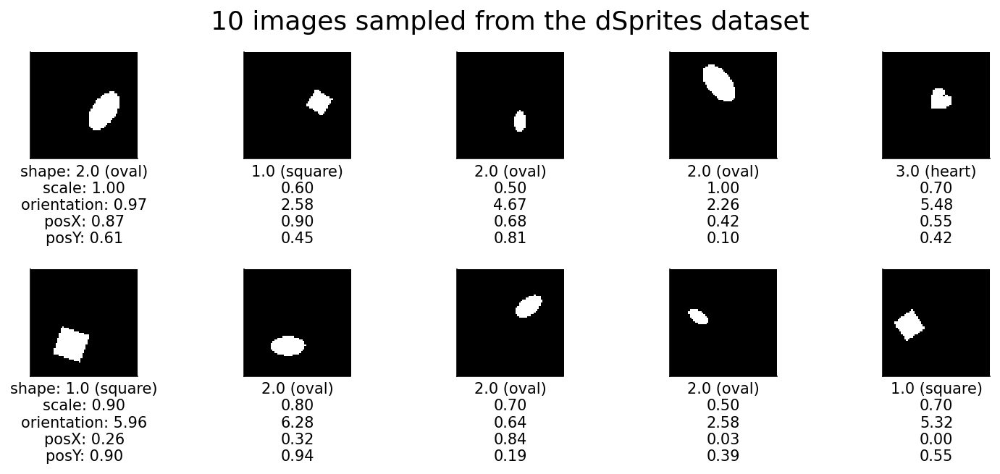

In [ ]:
# EXERCISE: to view different images, set randst to any integer value.
dSprites.show_images(num_images=10, randst=SEED)

## Section 1.2: Training a classifier with and without representations  

Now, we will investigate how 2 different types of classifiers perform when trained to decode the shape latent dimension of images in the **dSprites dataset**.  

Specifically, we will train **one classifier directly on the images**, and **another on the output of an encoder network**.

The **encoder network** we will use here and throughout the tutorial is the multi-layer convolutional network, pictured below. It comprises 2 consecutive convolutional layers, followed by 3 fully connected layers, and uses average pooling and batch normalization between layers, as well as rectified linear units as non-linearities. 

![](https://drive.google.com/uc?id=1-vlGGg4JCjVDyWC1Ytd4x9eFWoNrObqV)

### Coding Exercise 1.2.1: Training a logistic regression classifier directly on images.

The following code:
*    seeds modules that will use random processes, to ensure the results are consistently reproducible, using the `seed_processes()` function,
*    collects the dSprites dataset into a torch dataset using the `data.dSpritesTorchDataset` class, 
*    initializes a training and test sampler to keep the two datasets separate using the `data.train_test_splix_idx()` function.

_(cont'd below)_

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# initialize a torch dataset, specifying the target latent dimension for 
# the classifier
dSprites_torchdataset = data.dSpritesTorchDataset(
    dSprites, 
    target_latent="shape"
    )

# initialize a train_sampler and a test_sampler to keep the two sets 
# consistently separate
train_sampler, test_sampler = data.train_test_split_idx(
    dSprites_torchdataset, 
    fraction_train=0.8, # 80:20 data split
    randst=SEED
    )

print(f"Dataset size: {len(train_sampler)} training, "
  f"{len(test_sampler)} test images")

Dataset size: 16000 training, 4000 test images


### Coding Exercise 1.2.1: Training a logistic regression classifier directly on images (cont'd).

The following code:
*    trains a logistic regression directly on the training set images to classify their shape, and assesses its performance on the test set images using the `models.train_classifier()` function.

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 1 and 50 epochs. (The original setting is `num_epochs=25`.)

In [ ]:
# call this before any network initializing and training, to ensure reproducibility
seed_processes(SEED)

num_epochs = 25 # EXERCISE: try different numbers of training epochs

# train a classifier directly on the images
print("Training a classifier directly on the images...")
_ = models.train_classifier(
    encoder=None, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    num_epochs=num_epochs, 
    verbose=True # print results
    )

Training a classifier directly on the images...



Network performance after 25 classifier training epochs (chance: 33.33%):
    Training accuracy: 51.81%
    Testing accuracy: 39.55%


As we can observe, the classifier trained directly on the images performs only a bit above chance (39.55%) on the test set, after 25 training epochs.

### Coding Exercise 1.2.2: Training a logistic regression classifier along with an encoder.

The following code:
*    uses the same dSprites torch dataset (`dSprites_torchdataset`) initialized above, as well as the training and test samplers (`train_sampler`, `test_sampler`),
*    again, seeds modules that will use random processes, to ensure the results are consistently reproducible,
*    initializes an encoder network to use in the supervised network using the `models.EncoderCore` class,
*    trains a logistic regression on top of the encoder network to classify images based on shape, and assesses its performance on the test set images using `models.train_classifier()` with `freeze_features=False` to ensure that the encoder is trained along with the classifier.

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 1 and 25 epochs. (The original setting is `num_epochs=10`.)


In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# initialize a core encoder network on which the classifier will be added
supervised_encoder = models.EncoderCore()

num_epochs = 10 # EXERCISE: try different numbers of training epochs

# train an encoder and classifier on the images
print("Training a supervised encoder and classifier...")
_ = models.train_classifier(
    encoder=supervised_encoder, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    freeze_features=False, # we want to train the encoder, along with the classifier layer
    num_epochs=num_epochs, 
    verbose=True # print results
    )

Training a supervised encoder and classifier...



Network performance after 10 encoder and classifier training epochs (chance: 33.33%):
    Training accuracy: 100.00%
    Testing accuracy: 98.50%


When the classifier is trained with an encoder network, however, it achieves very high classification accuracy (98.50%) on the test set, after just 10 training epochs.

---

# Section 2: Supervised learning induces invariant representations.


### **To do:** Add video

### **To do:** Add description

## Section 2.1: Examining Representational Similarity Matrices (RSMs)

To examine the representations learned by the encoder network, we use **Representational Similarity Matrices (RSMs)**. In these matrices, the similarity between the encoder's representations of each possible pair of images is plotted to reveal overall structure in representation space.  

_N.B.: Here, we cosine similarity as a measure of representational similarity._


### Coding Exercise 2.1: Plot the supervised network encoder RSM along different latent dimensions.

In this exercise, we calculate the RSM for representations of the test set images generated by the supervised network encoder. 

The following code:
*    calculates and plots the RSM for the test set, with rows and columns sorted by whichever latent dimension is specified (e.g., `sorting_latent="shape"`) using `models.plot_model_RSMs()`.

**Exercise:** In the current example, the rows and columns of the RSM are organized by along the `shape` latent dimension. Try organizing them along one of the other latent dimensions (`"posX"`, `"posY"`, `"orientation"` or `"scale"`) to see whether different patterns emerge. (The original setting is `sorting_latent="shape"`.)

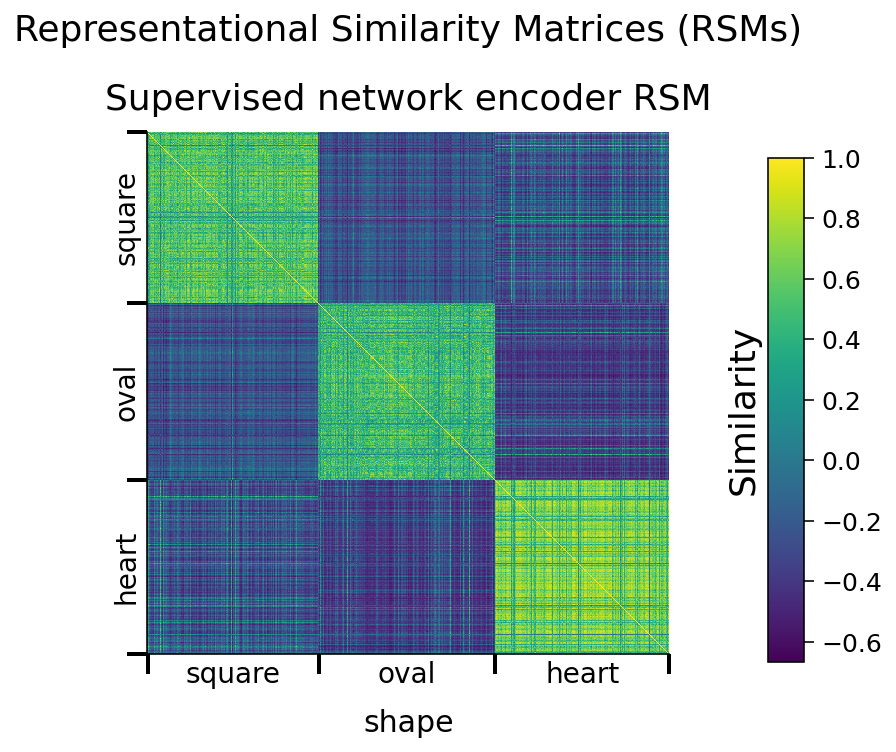

In [ ]:
sorting_latent = "shape" # EXERCISE: try sorting by different latent dimensions

print("Plotting RSMs...")
_ = models.plot_model_RSMs(
    encoders=supervised_encoder, # we pass the trained supervised_encoder
    dataset=dSprites_torchdataset, 
    sampler=test_sampler, # we want to see the representations on the held out test set
    titles="Supervised network encoder RSM", # plot title
    sorting_latent=sorting_latent,
    )

### Discussion 2.1: What patterns do the RSMs reveal about how the encoder represents different images? 
*    What does the yellow (maximal similarity color) diagonal, going from the top left to the bottom right, correspond to?
*    What pattern can be observed when comparing RSM values for pairs of images that share a similar latent value (e.g., 2 heart images) vs pairs of images that do not (e.g., a heart and a square image)? 
*    Do some shapes appear to be encoded more similarly than others?
*    Do some latent dimensions show clearer RSM patterns than others? Why might that be so?

---

# Section 3: Random projections don’t work as well



### **To do:** Add video

### **To do:** Add description

## Section 3.1: Examining RSMs of an untrained encoder

To determine whether the patterns observed in the RSMs of the supervised network encoder are trivial, we investigate whether they also emerge from the **random projections of an untrained encoder**.

### Coding Exercise 3.1: Plot an untrained network encoder RSM along different latent dimensions.

In this exercise, we repeat the same analysis as in **Section 2.1**, but with an untrained encoder.  

The following code:
*    initializes an encoder network to use in the untrained network using the `models.EncoderCore` class,
*    calculates the RSM it produces for the test set, with rows and columns sorted by whichever latent dimension is specified (e.g., `"shape"`)

**Exercise:** As above, in the current example, the rows and columns of the RSMs are organized by along the `shape` latent dimension. Try organizing them along one of the other latent dimensions (`"posX"`, `"posY"`, `"orientation"` or `"scale"`) and compare the patterns observed for the trained versus the untrained encoder network. (The original setting is `sorting_latent="shape"`.)

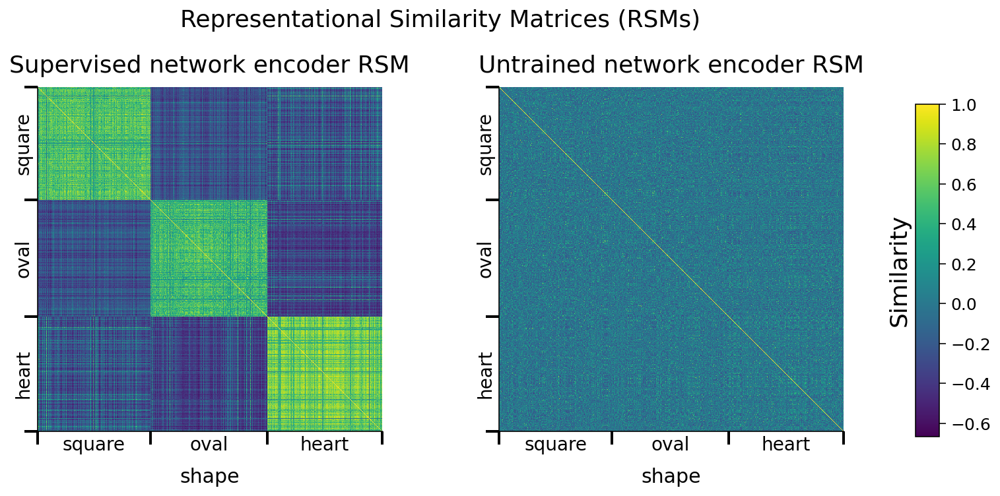

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# initialize a core encoder network that will not get trained
untrained_encoder = models.EncoderCore()

sorting_latent = "shape" # EXERCISE: try sorting by different latent dimensions

print("Plotting RSMs...")
_ = models.plot_model_RSMs(
    encoders=[supervised_encoder, untrained_encoder], # we pass both encoders
    dataset=dSprites_torchdataset, 
    sampler=test_sampler, # we want to see the representations on the held out test set
    titles=["Supervised network encoder RSM", "Untrained network encoder RSM"], # plot titles
    sorting_latent=sorting_latent,
    )

### Discussion 3.1: What does comparing these RSMs reveal about the potential value of trained versus untrained encoder representations? 

*    What patterns, if any, are visible in the untrained network encoder RSM? 
*    Which encoder network is most likely to produce meaningful representations?

### Coding Exercise 3.1: Evaluate the classification performance of a logistic regression trained on the representations produced by an untrained network encoder.

In this exercise, we repeat a similar analysis to **Section 1.2.2**, but with the untrained encoder network. Importantly, this time, the encoder parameters must stay frozen during training by setting `freeze_features=True`. 


The following code:
*    trains a logistic regression on top of the untrained encoder network to classify images based on shape, and assesses its performance on the test set images using `models.train_classifier()` with `freeze_features=True` to ensure that the encoder is **not** trained, and only the classifier is.

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 10 and 100 epochs. (The original setting is `num_epochs=25`.)


In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

num_epochs = 25 # EXERCISE: Try different numbers of training epochs

# train classifier on the randomly encoded images
print("Training a classifier on the untrained encoder representations...")
_ = models.train_classifier(
    encoder=untrained_encoder, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    freeze_features=True, # keep the encoder frozen while training the classifier
    num_epochs=num_epochs, 
    verbose=True # print results
    )

Training a classifier on the untrained encoder representations...



Network performance after 25 classifier training epochs (chance: 33.33%):
    Training accuracy: 46.02%
    Testing accuracy: 44.67%


The network performs at 44.67% accuracy on the test dataset, after 25 classifier training epochs. 

### Discussion 3.2: What can we conclude about the potential consequences of using random projections with a dataset like dSprites? 

*    How does the classifier performance compare to (A) the classifier trained directly on the images and (B) the classifier trained along with the encoder? 
*    What explains these different performances?

---

# Section 4: Generative approaches to representation learning can fail.


### **To do:** Add video

### **To do:** Add description

## Section 4.1: Examining the RSMs of a Variational Autoencoder

We next ask what kind of representations a network can learn in the absence of labelled data. We first look at a **generative model**, namely the **Variational Autoencoder (VAE)**. 


The following code:
*    initializes an encoder network to use in the VAE network using the `models.EncoderCore` class with `vae=True`,
*    pre-trains the full VAE network on the generative task of reconstructing the input images, under the Kullback–Leibler divergence (KLD) minimization constraint over the latent space that characterizes VAEs. Uses `models.train_vae()` which returns both the trained encoder `vae_encoder` and the trained decoder `vae_decoder`.

_N.B.: We increase the number of epochs here to 100, as the generative task is more complex than a classification task._

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# initialize a core encoder network on which the classifier will be added
vae_encoder = models.EncoderCore(vae=True)

# pre-train the encoder on the reconstruction and KL divergence tasks
print("Pre-training a VAE network...")
num_epochs = 100 # generative tasks will typically take longer to train
vae_encoder, vae_decoder, _ = models.train_vae(
    encoder=vae_encoder, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    num_epochs=num_epochs, 
    )

Pre-training a VAE network...


Once the VAE is pre-trained, we can sample images from the test set, and take a look at the quality of the reconstructions using `models.plot_vae_reconstructions()`.

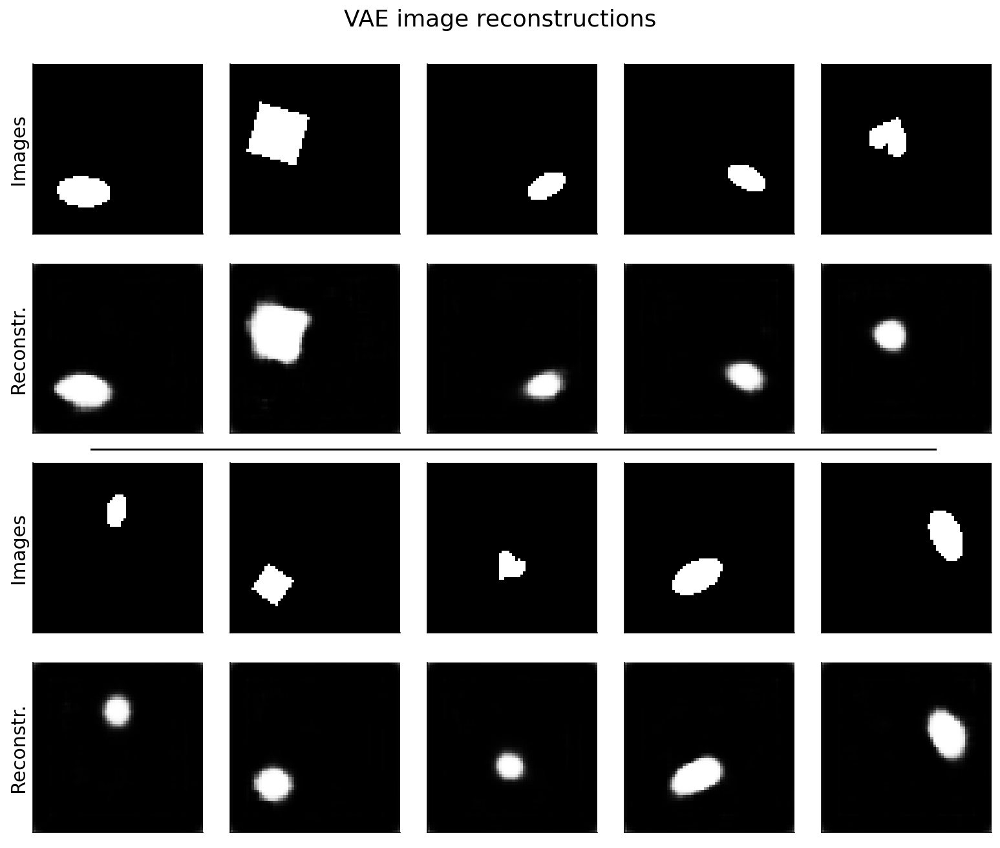

In [ ]:
models.plot_vae_reconstructions(
    vae_encoder, # trained encoder
    vae_decoder, # trained decoder
    dataset=dSprites_torchdataset, 
    indices=test_sampler.indices[:10], # show 10 first images from the test set 
    title="VAE image reconstructions", 
    )

### Discussion 4.1: How does the VAE perform on the reconstruction task? 
*    Which latent features does the network appear to encode well, and which does it encode less well?

_N.B.: This VAE network uses a convolution encoder (our code encoder network), and a deconvolution decoder. This may affect its ability to reconstruct complex shapes with minimal training._

### Coding Exercise 4.1: Evaluate the RSMs produced by the VAE encoder network.

We will now compare the pre-trained VAE encoder network RSM to the previously generated encoder RSMs. 

**Exercise:** Try visualizing the RSMs organized along a different latent dimension. (The original setting is `sorting_latent="shape"`.)

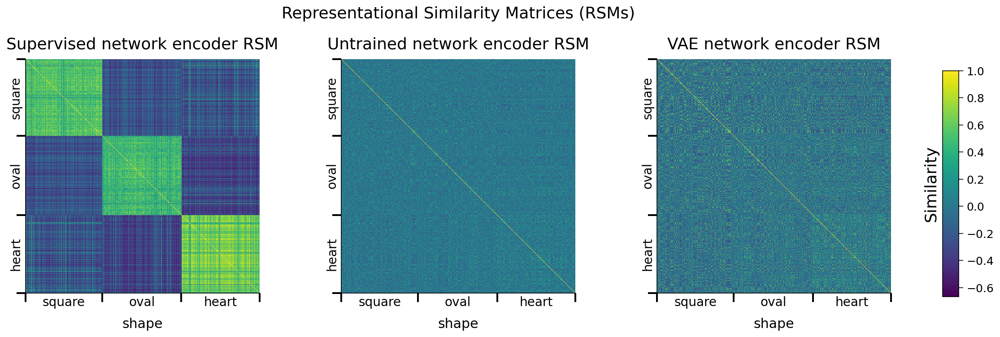

In [ ]:
sorting_latent = "shape" # try sorting by different latent dimensions

print("Plotting RSMs...")
_ = models.plot_model_RSMs(
    encoders=[supervised_encoder, untrained_encoder, vae_encoder], # we pass all three encoders
    dataset=dSprites_torchdataset, 
    sampler=test_sampler, # we want to see the representations on the held out test set
    titles=["Supervised network encoder RSM", "Untrained network encoder RSM", 
            "VAE network encoder RSM"], # plot titles
    sorting_latent=sorting_latent,
    )

### Discussion 4.1: What can we conclude about the the ability of generative models like VAEs to construct a meaningful representation space?

*    How do the pre-trained VAE encoder RSMs (sorted along different latent dimensions) compare to the supervised and untrained encoder network RSMs? 
*    What explains these different RSMs?
*    How well will the pre-trained VAE encoder likely perform on the shape classification task, as compared to the other encoder networks?
*    Might the pre-trained VAE encoder be better suited to predicting a different latent dimension?

### Coding Exercise 4.2: Evaluate the classification performance of a logistic regression trained on the representations produced by the pre-trained VAE network encoder.

For the pre-trained VAE encoder, as the encoder parameters have already been trained, they are kept frozen while the classifier is trained by setting `freeze_features=True`.   

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 10 and 100 epochs. (The original setting is `num_epochs=25`.)

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

num_epochs = 25 # EXERCISE: Try different numbers of training epochs

# train classifier on the VAE encoded images
print("Training a classifier on the pre-trained VAE encoder representations...")
_ = models.train_classifier(
    encoder=vae_encoder, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    freeze_features=True, # keep the encoder frozen while training the classifier
    num_epochs=num_epochs, 
    verbose=True # print results
    )

Training a classifier on the pre-trained VAE encoder representations...



Network performance after 25 classifier training epochs (chance: 33.33%):
    Training accuracy: 48.40%
    Testing accuracy: 47.45%


The network performs at 47.45% accuracy on the test dataset, after 25 classifier training epochs. 

---

# Section 5: The modern approach to self-supervised training for invariance.

### **To do:** Add video

### **To do:** Add description

## Section 5.1: Examining different options for learning invariant representations.

We now take a look at a few options for learning invariant shape representations for a dataset such as dSprites.  

### Coding Exercise 5.1: Visualize a few different image transformations available that could be used to learn invariance.

The following code:
*    initializes a set of transforms called `invariance_transforms` using the `torchvision.transforms.RandomAffine` class,
*    collects the dSprites dataset into a torch dataset `dSprites_invariance_torchdataset` which takes the `invariance_transforms` as input and deploys the transforms when it is called, 
*    shows a few examples of images and their transformed versions using the `data.dSpritesTorchDataset` `show_images()` method. 

The `torchvision.transforms.RandomAffine` class enables us to predetermine which types and ranges of transforms will be sampled from when transforming the images, by setting the following arguments:
*    `degrees`: absolute maximum number of degrees to rotate
*    `translate`: absolute maximum proportion of width to shift in x, and of height to shift in y
*   `scale`: minimum to maximum scaling factor

**Exercise:** Try out a few combinations of the transformation parameters, and visualize the resulting effects on the original images. (The original settings are `degrees=90`, `translate=(0.2, 0.2)`, `scale=(0.8, 1.2)`.) 

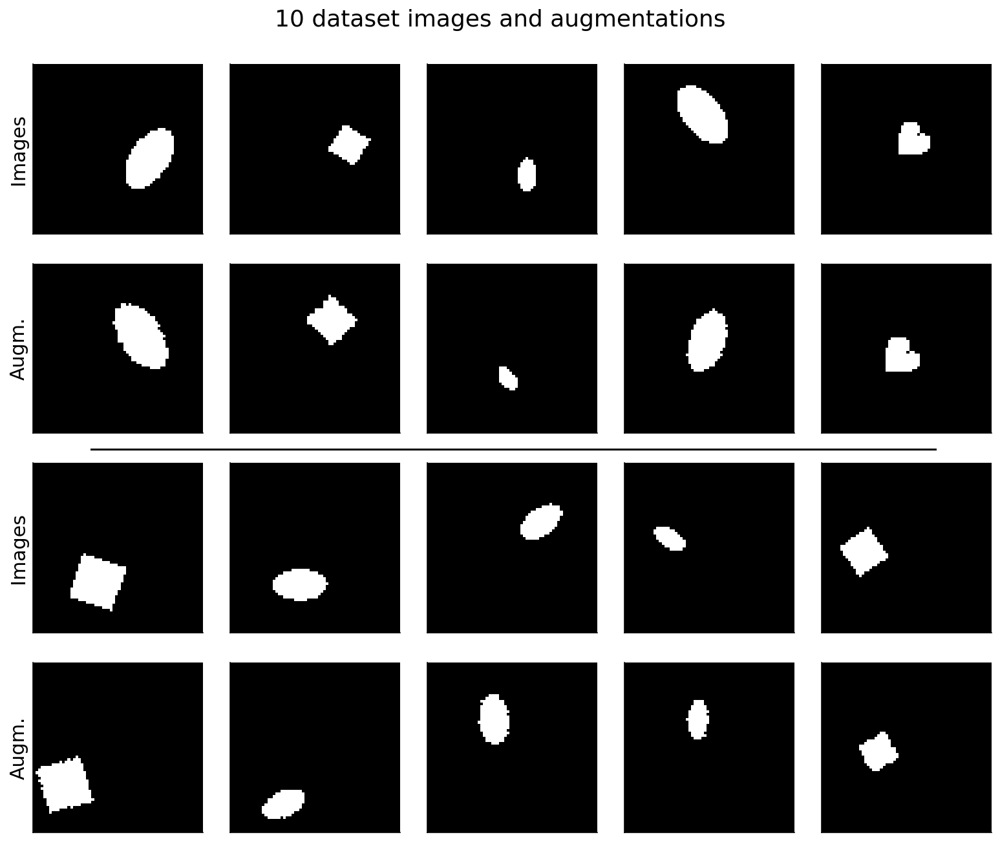

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# EXERCISE: try some random affine data augmentations combinations to apply to the images
invariance_transforms = torchvision.transforms.RandomAffine(
    degrees=90, 
    translate=(0.2, 0.2), # (in x, in y)
    scale=(0.8, 1.2) # min to max scaling
)

# initialize a simclr-specific torch dataset 
dSprites_invariance_torchdataset = data.dSpritesTorchDataset(
    dSprites, 
    target_latent="shape", 
    simclr=True, 
    simclr_transforms=invariance_transforms
    )

# show a few example images are their augmentations
_ = dSprites_invariance_torchdataset.show_images(randst=SEED)

---

# Section 6: How to train for invariance to transformations with a target network.

### **To do:** Add video

### **To do:** Add description

## Section 6.1: Using image transformations to learn feature invariant representations in an SSL network.

We now observe the effects of selecting certain transformations compared to others on the invariance learned by an encoder network trained with a **specific type of SSL algorithm, namely SimCLR**. Specifically, we observe how pre-training an encoder network with SimCLR affects the performance of a classifier trained on the representations the network has learned.  

The following code:
*    initializes a set of transforms called `simclr_transforms` using the `torchvision.transforms.RandomAffine` class for use with the SimCLR network,
*    collects the dSprites dataset into a torch dataset `dSprites_invariance_torchdataset` which takes the `simclr_transforms` as input to deploy the transforms during the SimCLR network training, 
*    initializes an encoder network to use in the SimCLR network using the `models.EncoderCore` class,
*    pre-trains the full SimCLR network on the task SimCLR contrastive task using `models.train_simclr()`.

_N.B.: We use 50 epochs here, as the contrastive task is generally more complex than a classification task._

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# EXERCISE: set different random affine data augmentations to apply to the images
simclr_transforms = torchvision.transforms.RandomAffine(
    degrees=90, 
    translate=(0.2, 0.2), # (in x, in y)
    scale=(0.8, 1.2) # min to max scaling
)

# as above, initialize a simclr-specific torch dataset 
dSprites_simclr_torchdataset = data.dSpritesTorchDataset(
    dSprites, 
    target_latent="shape", 
    simclr=True, 
    simclr_transforms=simclr_transforms
    )

# initialize and pre-trains a SimCLR core encoder network
print("Pre-training a SimCLR network...")
num_epochs = 50
simclr_encoder = models.EncoderCore()
_ = models.train_simclr(
    encoder=simclr_encoder, 
    dataset=dSprites_simclr_torchdataset, 
    train_sampler=train_sampler, 
    num_epochs=num_epochs, 
    batch_size=1000,
    )

Pre-training a SimCLR network...


### Coding Exercise 6.1: Train a SimCLR encoder that was pre-trained using different image transformations, on the image classification task.

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 10 and 100 epochs. (The original setting is `num_epochs=25`.)

In [ ]:
# call this before any network initializing and training, to ensure reproducibility
seed_processes(SEED)

num_epochs = 25 # EXERCISE: try different numbers of training epochs

# train classifier on the SimCLR encoded images
print("Training a classifier on the pre-trained SimCLR encoder representations...")
_ = models.train_classifier(
    encoder=simclr_encoder, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    freeze_features=True, # keep the encoder frozen while training the classifier
    num_epochs=num_epochs, 
    verbose=True
    )

Training a classifier on the pre-trained SimCLR encoder representations...



Network performance after 25 classifier training epochs (chance: 33.33%):
    Training accuracy: 92.28%
    Testing accuracy: 92.10%


The network (using the transforms proposed above) performs at 92.10% accuracy on the test dataset, after 25 classifier training epochs. 

---

# Section 7: Self-supervised representations learn invariance.

### **To do:** Add video

### **To do:** Add description

## Section 7.1: The effects of using data transformations on invariance in SimCLR network representations.

We now observe the effects of adding our data transformations on the invariance learned by a pre-trained SimCLR network encoder.  

### Coding Exercise 7.1: Visualize the network encoder RSMs, organized along different latent dimensions.

**Exercise:** Try visualizing the RSMs organized along a different latent dimension.

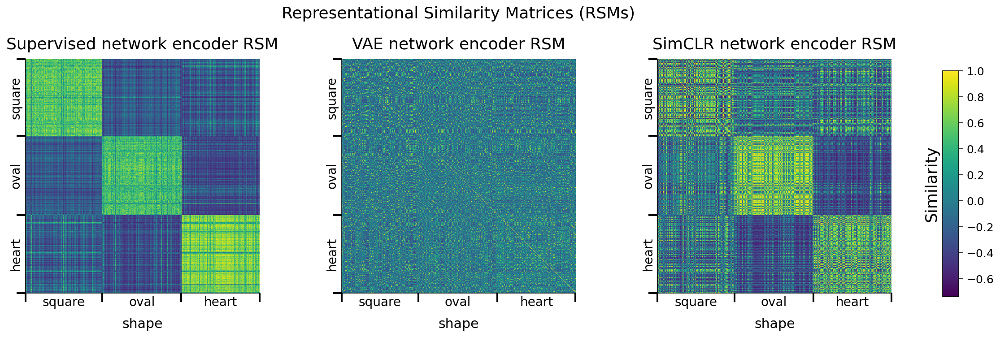

In [ ]:
sorting_latent = "shape" # EXERCISE: try sorting by different latent dimensions

print("Plotting RSMs...")
_ = models.plot_model_RSMs(
    encoders=[supervised_encoder, vae_encoder, simclr_encoder],
    dataset=dSprites_torchdataset, 
    sampler=test_sampler, # we want to see the representations on the held out test set
    titles=["Supervised network encoder RSM", "VAE network encoder RSM", 
            "SimCLR network encoder RSM"], # plot titles
    sorting_latent=sorting_latent 
    )

### Discussion 7.1: What can we conclude about the ability of contrastive models like SimCLR to construct a meaningful representation space?

*    How do the pre-trained SimCLR encoder RSMs (sorted along different latent dimensions) compare to the supervised and pre-trained VAE encoder network RSMs? 
*    What explains these different RSMs?
*    What advantages might some encoders have other others?
*    How might one modify the SimCLR encoder pre-training, for example, if the downstream task were to predict orientation instead of shape?

---

# Section 8: Avoiding representational collapse.


### **To do:** Add video

### **To do:** Add description

## Section 8.1: The effects of reducing the number of negative examples used in the SimCLR contrastive loss.

Typically, a trick used to train neural networks on contrastive losses is to use large batch sizes (here, we use 1,000 examples per batch), and to use the representations of different images in a batch as **each other's negative examples**. So with a batch size of 1,000, each image has one positive paired image (its augmentation), and 1,998 negative paired images (all the other images and their augmentations). This enables the contrastive loss to obtain a good estimate of the full representational distribution.  

To observe the consequences of sampling using fewer negative examples in the contrastive loss, we train a SimCLR network again, but this time, we set the `neg_pairs=2`. Under the hood, this parameter affects only the contrastive loss calculation, allowing it to use **only 2 of the total available negative pairs in a batch, for each image.**

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

# initialize and pre-trains a SimCLR core encoder network
num_epochs = 50
neg_pairs = 2 # set number of negative pairs per image

print(f"Pre-training a SimCLR network using only {neg_pairs} negative pairs "
  "per image for the loss calculation...")
simclr_encoder_neg_pairs = models.EncoderCore()
_ = models.train_simclr(
    encoder=simclr_encoder_neg_pairs, 
    dataset=dSprites_simclr_torchdataset, 
    train_sampler=train_sampler, 
    num_epochs=num_epochs, 
    batch_size=1000,
    neg_pairs=neg_pairs,
    )

Pre-training a SimCLR network using only 2 negative pairs per image for the loss calculation...


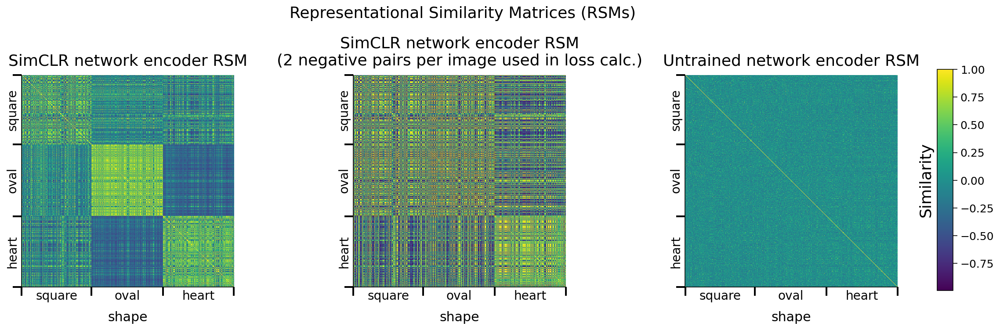

In [ ]:
# plot encoder RSMs
sorting_latent = "shape" # try sorting by different latent dimensions
simclr_rsm, simclr_neg_pairs_rsm, untrained_rsm = models.plot_model_RSMs(
    encoders=[simclr_encoder, simclr_encoder_neg_pairs, untrained_encoder],
    dataset=dSprites_torchdataset, 
    sampler=test_sampler, # we want to see the representations on the held out test set
    titles=["SimCLR network encoder RSM", 
            f"SimCLR network encoder RSM\n({neg_pairs} negative pairs per image used in loss calc.)",
            "Untrained network encoder RSM"], # plot titles
    sorting_latent=sorting_latent 
    )

To compare the RSMs of the normal SimCLR network and the few negative pairs network, we can plot their vales on a histogram.

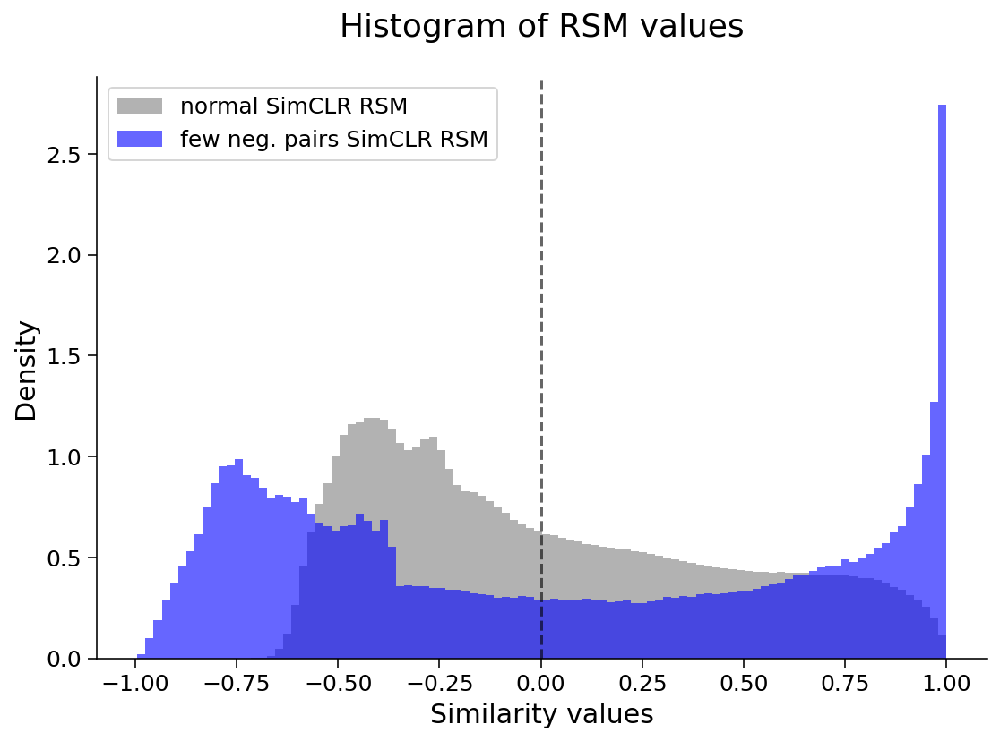

In [ ]:
plot_rsm_histogram(
    [simclr_rsm, simclr_neg_pairs_rsm], 
    colors=["gray", "blue"], 
    labels=["normal SimCLR RSM", "few neg. pairs SimCLR RSM"], 
    nbins=100
    )

### Discussion 8.1: What can we conclude about the importance of negative pairs in computing the contrastive loss for models like SimCLR?

*    How does changing the number of negative pairs affect the networks' RSMs?
*    How is the shape classifier likely to perform when the encoder is pre-trained with very few negative pairs?
*    What, intuitively, is the role of negative pairs in shaping the representational space that a contrastive model learns, and how does this role relate to the role of positive pairs?

### Coding Exercise 8.1: Evaluate the classification performance of a logistic regression trained on the representations produced by the SimCLR network encoder pre-trained with only a few negative pairs.

**Exercise:** Try a few different `num_epochs` settings to see whether performance improves with more training, e.g., between 10 and 100 epochs. (The original setting is `num_epochs=25`.)

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

num_epochs = 25 # EXERCISE: try different numbers of training epochs

# train classifier on the randomly encoded images
print(f"Training a classifier on the representations learned by the SimCLR "
    f"network encoder pre-trained\nusing only {neg_pairs} negative pairs per image "
    "for the loss calculation...")
_ = models.train_classifier(
    encoder=simclr_encoder_neg_pairs, 
    dataset=dSprites_torchdataset, 
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    freeze_features=True, # keep the encoder frozen while training the classifier
    num_epochs=num_epochs, 
    verbose=True
    )

Training a classifier on the representations learned by the SimCLR network encoder pre-trained
using only 2 negative pairs per image for the loss calculation...



Network performance after 25 classifier training epochs (chance: 33.33%):
    Training accuracy: 56.14%
    Testing accuracy: 55.25%


After dropping the number of negative pairs used per image in pre-training a SimCLR encoder, it performs at only 55.25% on the test dataset, after 25 classifier training epochs. 

---

# Section 9: Good representations enable few-shot learning.


### **To do:** Add video

### **To do:** Add description

## Section 9.1: The benefits of pre-training an encoder network in a few-short learning scenario, i.e., when only few labelled examples are available.

The toy dataset we have been using, **dSprites**, is thoroughly labelled along 5 different dimensions. However, this is not the case for many datasets. Some very large datasets may have few if any labels.

One of our last steps is to examine how each of our models perform in such a case when only few labelled images are available for training. In this scenario, we will train classifiers on different fractions of the training data (0.1 to 1.0), and see how they perform on the test set. 

For the difference types of encoder, this means:
*    **Supervised encoder:** As the supervised encoder can only be trained with labels, we will start from untrained encoders and train them end-to-end on the classification task with the fraction of labelled images allowed.  
_N.B.: Given that that network is trained end-to-end, we will train it for more epochs, and mark it with "\*" in the graphs._
*    **Untrained encoder:** By definition, the untrained encoder is untrained.
*    **VAE encoder**: As a generative model can be pre-trained on unlabelled data, we will use the VAE encoder pre-trained on the reconstruction task using the full dataset, before training the classifier layer with the fraction of labelled images allowed.
*    **SimCLR encoder**: As an SSL model can be pre-trained on unlabelled data, we will use the SimCLR encoder pre-trained on the contrastive task using the full dataset, before training the classifier layer with the fraction of labelled images allowed.

Using the following default labelled fraction values: 0.05, 0.1, 0.2, 0.4, 0.75, 1.0

Supervised encoder: training classifiers and encoders*...



Untrained encoder: training classifiers...



VAE encoder: training classifiers...



SimCLR encoder: training classifiers...


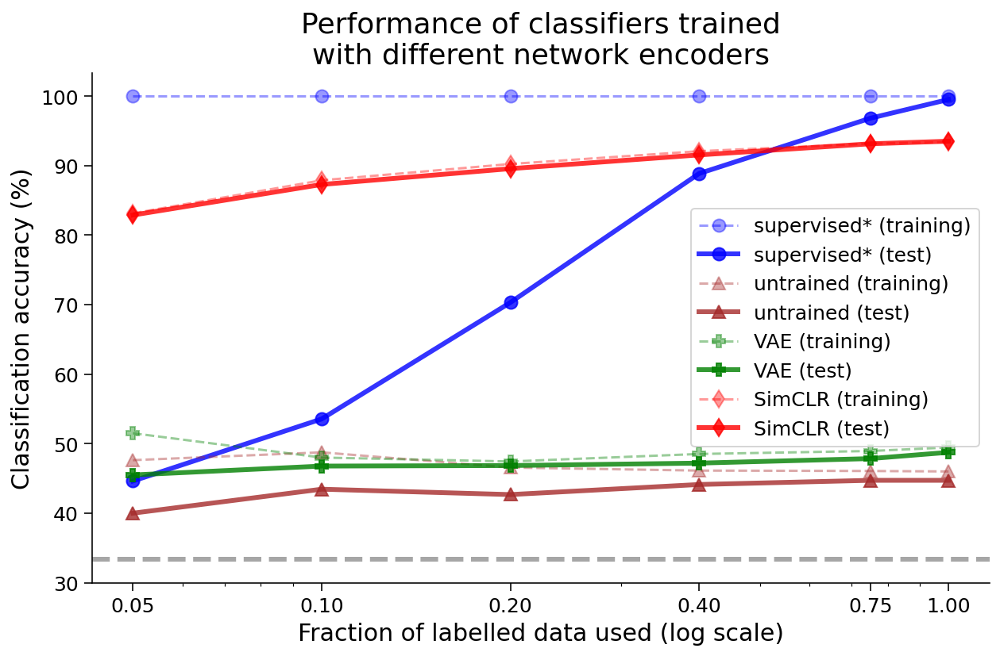

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

new_supervised_encoder = models.EncoderCore() # new, untrained supervised encoder

_ = models.train_encoder_clfs_by_fraction_labelled(
    encoders=[new_supervised_encoder, untrained_encoder, vae_encoder, simclr_encoder], 
    dataset=dSprites_torchdataset,
    train_sampler=train_sampler, 
    test_sampler=test_sampler, 
    num_epochs=[100, 50, 50, 50], # train the supervised encoder for more epochs
    freeze_features=[False, True, True, True], # only train new supervised encoder end-to-end
    subset_seed=SEED, 
    encoder_labels=["supervised", "untrained", "VAE", "SimCLR"], 
    title="Performance of classifiers trained\nwith different network encoders", 
    verbose=True
)

### Discussion 9.1: What can we conclude the advantages and disadvantages of the different encoder network types under different conditions?

*    Which models are most and least affected by how much labelled data is available?

---

# Section 10: Ethical considerations for self-supervised learning from biased datasets.


### **To do:** Add video

### **To do:** Add description

## Section 10.1: The consequences of training models on biased datasets.

If a model is trained on a biased dataset, it is likely to learn a representational encoding that reproduces these biases, impairing its ability to generalize properly and increasing the likelihood that it will propagate these biases forward.  

Here, we investigate the effects of training the models on a biased subset of the training dataset. Specifically, we introduce a `train_sampler_biased`, a training dataset sampler that only samples:
*    **squares**, if they are centered on the **lefthand** side of an image **(posX: 0 to 0.3)**,
*    **ovals**, if they are centered in the **center** of an image **(posX: 0.35 to 0.65)**, 
*    **hearts**, if they are centered on the **righthand** side of am image **(posX: 0.7 to 1.0)**.

This sampling bias introduces a correlation between `shape` and `posX` that does not exist in the original dataset.

We then train each model as above on the dataset, and observe their performance when tested on an unbiased dataset.

*N.B.: This biased sampling also significantly reduces the size of the training dataset available (approximately 6x). Thus, it would not be fair to compare our results here to those obtained previously in the tutorial, when we were using the full dataset. For this reason, as a control, we will also separately train the models with `train_sampler_bias_ctrl`, a training dataset sampler that does not share the same sampling bias as `train_sampler_biased`, but can only sample as many samples as `train_sampler_biased` can.*

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

bias_type = "shape_posX_spaced" # name of this bias

# initialize a biased training sampler and an unbiased test sampler
train_sampler_biased, test_sampler_for_biased = data.train_test_split_idx(
    dSprites_torchdataset, 
    fraction_train=0.95, # 95:5 split to compensate for loss of training examples due to bias
    randst=SEED,
    train_bias=bias_type
    )

# initialize a control, unbiased training sampler and an unbiased test sampler
train_sampler_bias_ctrl, test_sampler_for_bias_ctrl = data.train_test_split_idx(
    dSprites_torchdataset, 
    fraction_train=0.95, 
    randst=SEED,
    train_bias=bias_type,
    control = True
    )

print(f"Biased dataset: {len(train_sampler_biased)} training, "
  f"{len(test_sampler_for_biased)} test images")
print(f"Bias control dataset: {len(train_sampler_bias_ctrl)} training, "
  f"{len(test_sampler_for_bias_ctrl)} test images")

Biased dataset: 5808 training, 1000 test images
Bias control dataset: 5808 training, 1000 test images


We plot some images sampled with `train_sampler_biased` to observe the pattern described above where `shape` and `posX` are now correlated.

Plotting sample images from the biased training dataset.



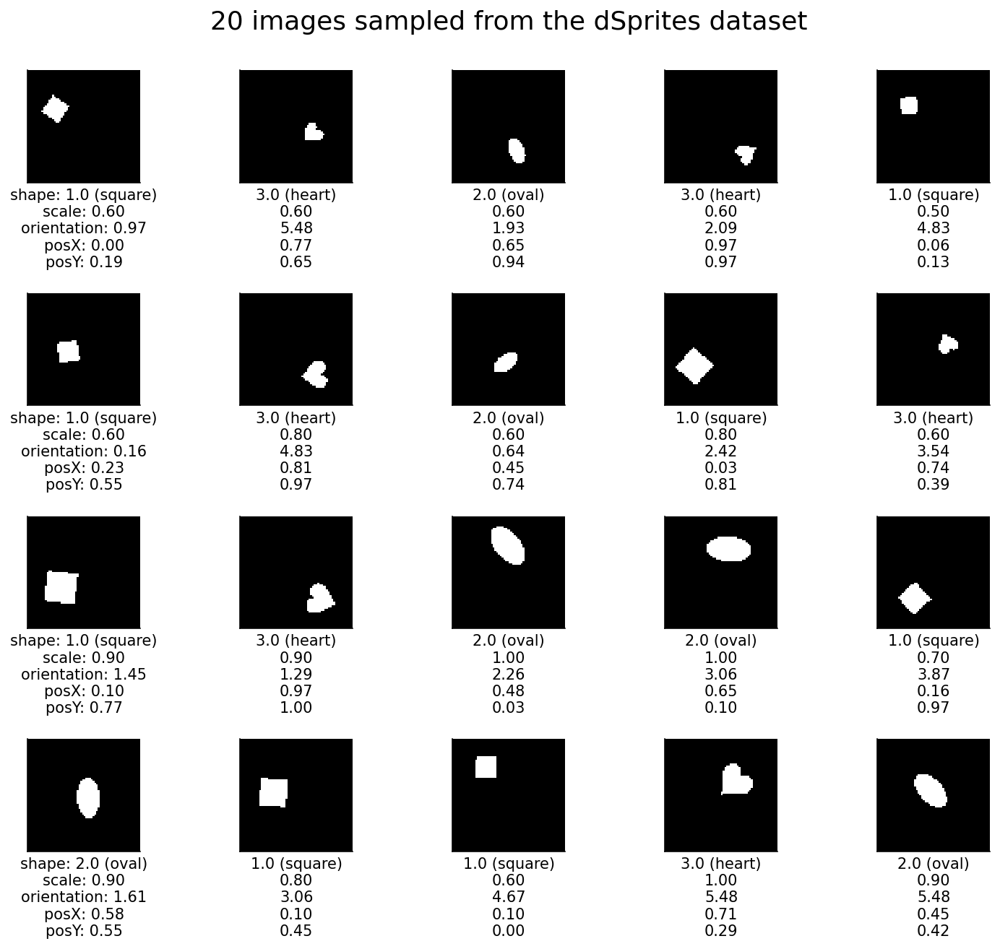

In [ ]:
print("Plotting sample images from the biased training dataset.\n")
dSprites.show_images(indices=train_sampler_biased.indices[:20], randst=SEED)

We also plot some images sampled with `train_sampler_bias_ctrl` to verify visually that this biased pattern does not appear in the control dataset.

Plotting sample images from the bias control training dataset.



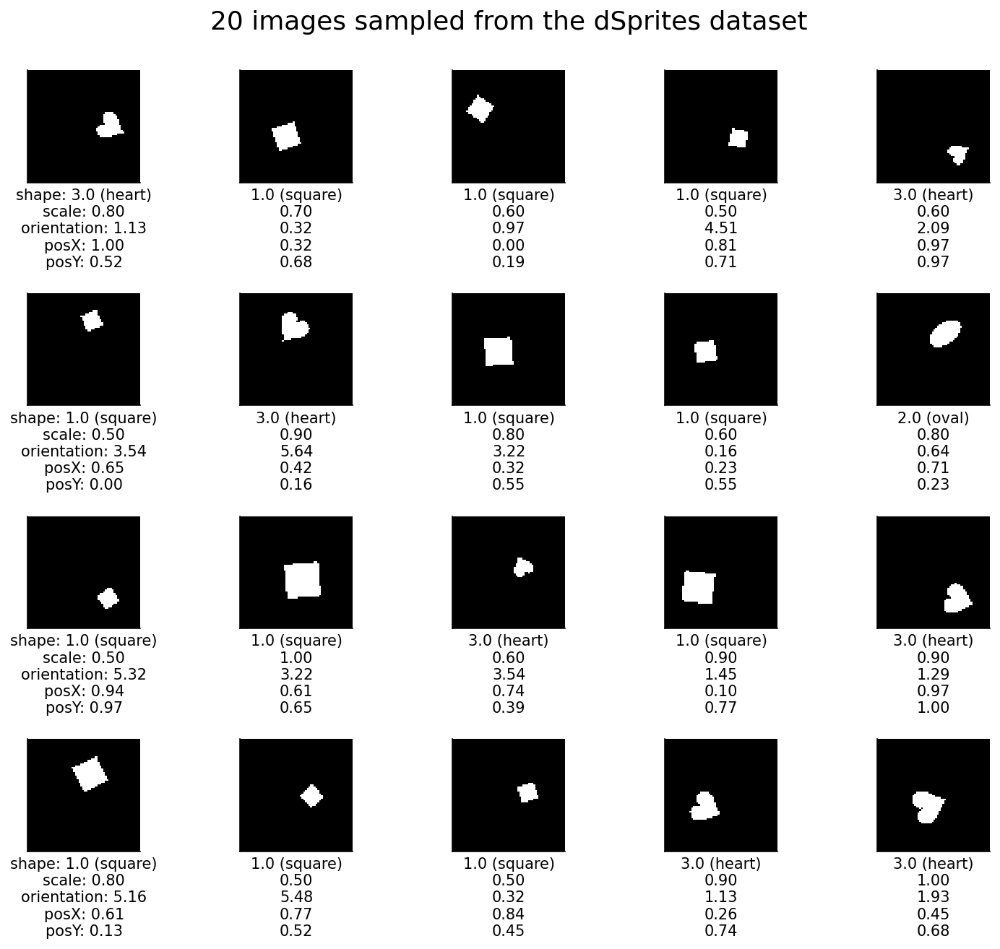

In [ ]:
print("Plotting sample images from the bias control training dataset.\n")
dSprites.show_images(indices=train_sampler_bias_ctrl.indices[:20], randst=SEED)

In [ ]:
# @markdown Function to run full training procedure (from initializing and pretraining encoders to training classifiers): `full_training_procedure(train_sampler, test_sampler)`

def full_training_procedure(train_sampler, test_sampler, title=None, 
                            verbose=True):

    supervised_encoder = models.EncoderCore()
    untrained_encoder = models.EncoderCore()
    vae_encoder = models.EncoderCore(vae=True)
    simclr_encoder = models.EncoderCore()

    encoders = [supervised_encoder, untrained_encoder, vae_encoder, simclr_encoder]
    freeze_features = [False, True, True, True]
    encoder_labels = ["supervised", "untrained", "VAE", "SimCLR"]

    num_vae_epochs = 200
    if verbose:
        print(f"Pre-training the VAE encoder for {num_vae_epochs} epochs...")
    _ = models.train_vae(
        encoder=vae_encoder, 
        dataset=dSprites_torchdataset, 
        train_sampler=train_sampler, 
        num_epochs=num_vae_epochs, 
        )

    num_simlr_epochs = 200
    if verbose:
        print(f"Pre-training the SimCLR encoder for {num_simlr_epochs} epochs...")
    _ = models.train_simclr(
        encoder=simclr_encoder, 
        dataset=dSprites_simclr_torchdataset, 
        train_sampler=train_sampler, 
        num_epochs=num_simlr_epochs, 
        batch_size=1000,
        )

    num_clf_epochs = [200, 100, 100, 100]
    print(f"Training supervised encoder and classifier for {num_clf_epochs[0]} "
      f"epochs, and all other classifiers for {num_clf_epochs[1]} epochs each...")
    _ = models.train_encoder_clfs_by_fraction_labelled(
        encoders=encoders, 
        dataset=dSprites_torchdataset,
        train_sampler=train_sampler, 
        test_sampler=test_sampler, 
        num_epochs=num_clf_epochs,
        freeze_features=freeze_features,
        subset_seed=SEED, 
        encoder_labels=encoder_labels,
        title=title, 
        verbose=verbose
        )

We now run the same analyses as in **Section 9**, but with our **biased training data sampler** (and unbiased control sampler) to observe how the different models perform. Because the dataset is much smaller, we increase the number of pre-trained and training epochs for the encoders and classifiers.

Let us start with our **unbiased control sampler**, to get a sense of the classification performance levels we should expect with a dataset this size.

Run all analyses using the control training dataset

Pre-training the VAE encoder for 200 epochs...



Pre-training the SimCLR encoder for 200 epochs...



Training supervised encoder and classifier for 200 epochs, and all other classifiers for 100 epochs each...
Using the following default labelled fraction values: 0.05, 0.1, 0.2, 0.4, 0.75, 1.0

Supervised encoder: training classifiers and encoders*...



Untrained encoder: training classifiers...



VAE encoder: training classifiers...



SimCLR encoder: training classifiers...


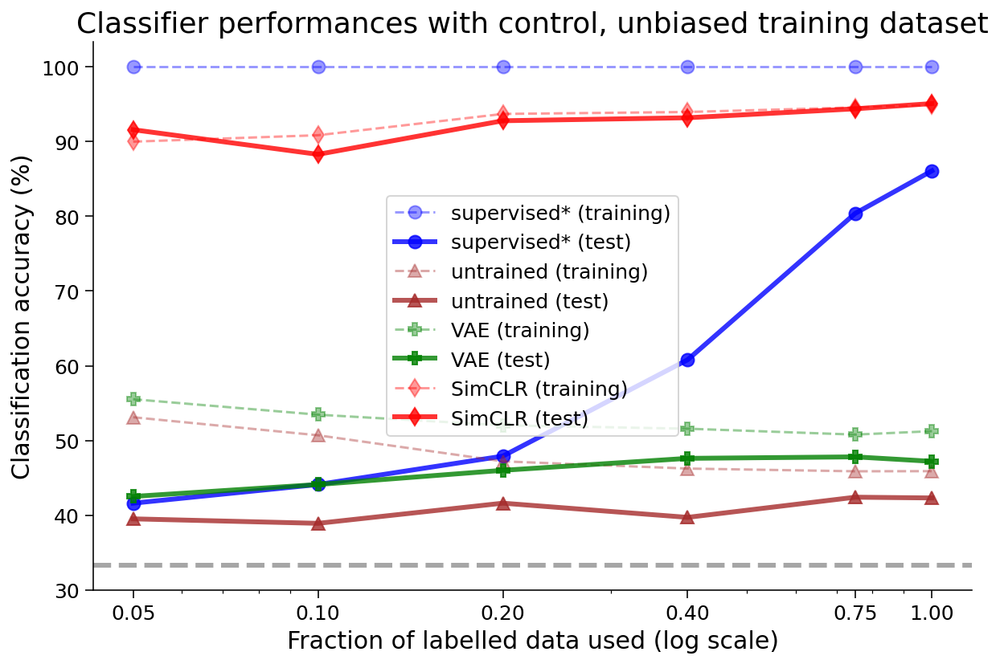

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

print("Training all models using the control, unbiased training dataset\n")
full_training_procedure(
    train_sampler_bias_ctrl, test_sampler_for_bias_ctrl, 
    title="Classifier performances with control, unbiased training dataset"
    )

A similar pattern is observed here as with the full dataset

Using the same parameters, we now repeat the analysis with the **biased** training data sampler.

Run all analyses using the biased training dataset

Pre-training the VAE encoder for 200 epochs...



Pre-training the SimCLR encoder for 200 epochs...



Training supervised encoder and classifier for 200 epochs, and all other classifiers for 100 epochs each...
Using the following default labelled fraction values: 0.05, 0.1, 0.2, 0.4, 0.75, 1.0

Supervised encoder: training classifiers and encoders*...



Untrained encoder: training classifiers...



VAE encoder: training classifiers...



SimCLR encoder: training classifiers...


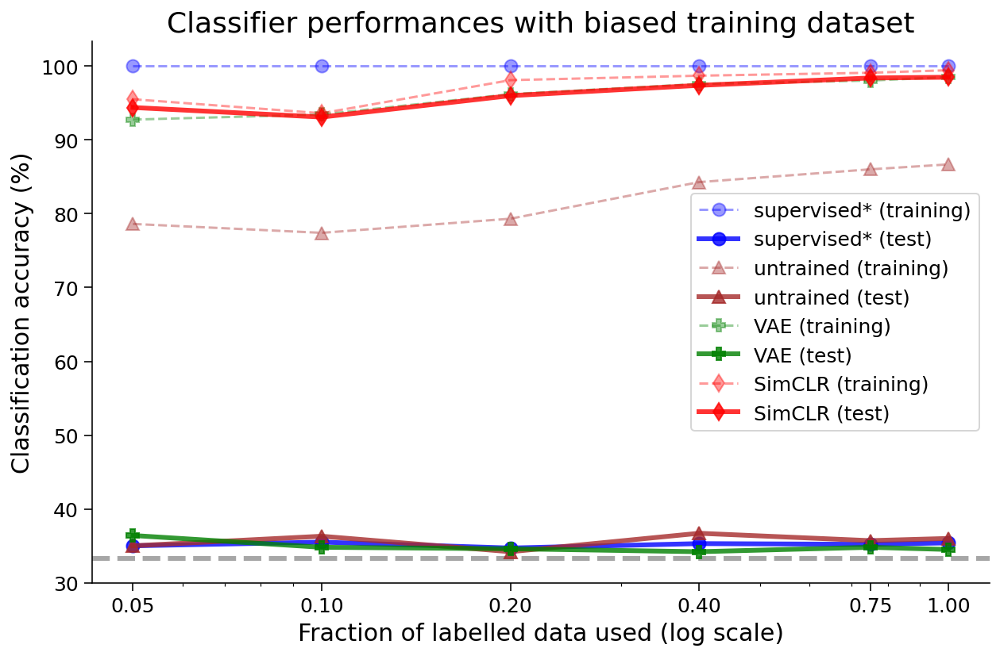

In [ ]:
# call this before any dataset/network initializing or training, to ensure reproducibility
seed_processes(SEED)

print("Training all models using the biased training dataset\n")
full_training_procedure(
    train_sampler_biased, test_sampler_for_biased, 
    title="Classifier performances with biased training dataset"
    )

### Discussion 10.1: How do different models cope with a biased training dataset?

*    Which models are most and least affected by the biased training dataset?
*    Which types of images in the test set are most likely causing the observed drop in performance?
*    Why might certain models be more robust to the bias introduced here than others?
*    What are some methods we can employ to help mitigate the negative effects of biases in our training sets on our ability to learn good data representations with our models?

### Discussion 10.2: How do these principles apply more generally?

We have seen now how self-supervised learning (SSL) can improve a network's ability to learn good representations of data. For the purposes of this tutorial, we presented examples with a simplified dataset: the dSprites dataset, where we know: 
(1) the latent dimensions for all images,  
(2) the joint probability distribution across latent dimensions for the full dataset, and  
(3) the precise nature of the bias introduced into our biased dataset **(Section 10)**. 

In real-world applications, with more complex or difficult datasets, 
*    What principles can we draw on to successfully apply SSL to learn good data representations?
*   What challenges might we face, compared to applying SSL to dSprites?